# PROBLEMA: ESTIMATIVA EXPERIMENTAL DA COMPLEXIDADE DE UMA FUNÇÃO DE UMA BIBLIOTECA

# Métodos de segmentação de imagens do tipo  Thresholding (Limiarização): 
> Divide uma imagem em regiões ou objetos binários com base em um valor de limiar. Bibliotecas: OpenCV, scikit-image.


## BIBLIOTECAS e FUNÇÕES

In [38]:
%matplotlib inline
#pip install -U scikit-learn
#pip install imagehash
#pip install -U matplotlib

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import colors

from sklearn.cluster import DBSCAN, KMeans

import seaborn as sns
sns.set()

from PIL import Image

import numpy as np
from numpy import mean
from numpy import isnan
from numpy import asarray

import os
import shutil, glob, os.path

from random import shuffle

from tqdm import tqdm

import math

import skimage
from skimage import data, io, color
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu 
from skimage.feature import canny 
from time import time
from random import randint
import cv2

from scipy import stats

from KMeans import KMeans
from tabulate import tabulate

In [39]:
def plotRegressao(x, y, titlex, titley):
    # Calcular a regressão linear -> primeira lternativa !!1
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    line = slope * np.array(x) + intercept
    
    # Calcular R^2 (coeficiente de determinação) e o coeficiente de correlação de Pearson
    r_squared = r_value ** 2
    pearson_coeficiente = r_value
    
    # Plotar os pontos e a linha de regressão linear
    plt.scatter(x, y, label='Pontos')
    plt.plot(x, line, color='red', label='Regressão Linear')
    
    # Adicionar título com R^2 e o coeficiente de correlação de Pearson
    titulo = f'Regressão Linear (R²={r_squared:.2f}, Pearson={pearson_coeficiente:.2f})'
    plt.title(titulo)
    # Adicionar legenda para a equação da linha
    plt.text(0.07, 0.5, f'{titley} = {slope:.2g}n + {intercept:.2g}', fontsize=12, transform=plt.gca().transAxes)
    
    # Adicionar legendas
    plt.xlabel(titlex)
    plt.ylabel(titley)
    plt.legend()
    
    # Exibir o gráfico
    plt.show()

## **2. Leitura das imagens na pasta**

files in directory:  C:\Users\duike\OneDrive\Documentos\Repositorios\EngenhariaDeProgramas\Experimentos\Credito2\FACES 
 ['branca01.jpg', 'branca02.jpg', 'branca03.jpg', 'casal_branco01.jpg', 'casal_moreno01.jpg', 'familia_branca01.jpg', 'familia_morena01.jpg', 'homem_branco01.jpg', 'homem_branco02.jpg', 'homem_branco03.jpg', 'homem_branco04.jpg', 'homem_moreno01.jpg', 'homem_moreno02.jpg', 'homem_moreno03.jpg', 'homem_moreno04.jpg', 'image_teste_segementacao_3_classes.png', 'jovem_branco01.jpg', 'jovem_branco02.jpg', 'jovem_branco03.jpg', 'jovem_branco04.jpg', 'jovem_loura01.jpg', 'jovem_moreno01.jpg', 'jovem_moreno02.jpg', 'jovem_moreno03.jpg', 'jovem_moreno04.jpg', 'morena01.jpg', 'morena02.jpg', 'morena03.jpg', 'mulher_morena01.jpg', 'mulher_morena02.jpg', 'mulher_morena03.jpg', 'senhora_branca01.jpg', 'senhora_branca02.jpg', 'senhora_branca03.jpg', 'senhora_branca04.jpg', 'senhora_morena01.jpg', 'senhora_morena02.jpg', 'senhora_morena03.jpg', 'senhora_morena04.jpg', 'senhor_branco

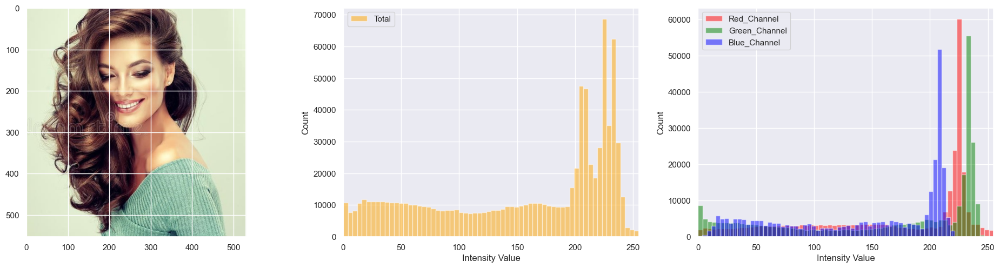


Imagem # 2 : branca02.jpg
resolução da imagem:  (900, 675, 3)
number of color channels:  3


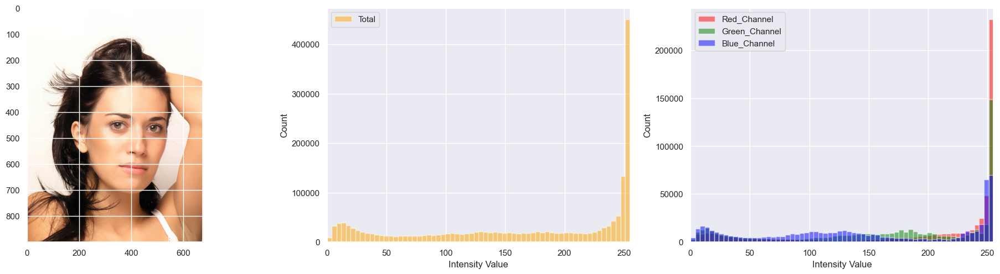


Imagem # 3 : branca03.jpg
resolução da imagem:  (533, 626, 3)
number of color channels:  3


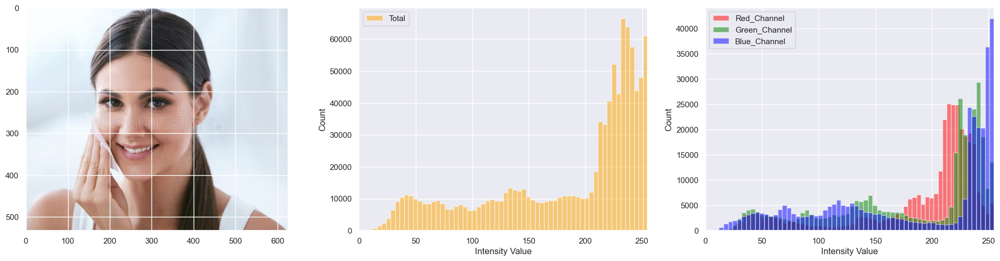

In [40]:
# PREPROCESSAMENTO DAS IMAGENS
INPUT_PATH = 'C:\\Users\\duike\\OneDrive\\Documentos\\Repositorios\\EngenhariaDeProgramas\\Experimentos\\Credito2\\FACES'
Files=os.listdir(INPUT_PATH)
print("files in directory: ",INPUT_PATH,"\n",os.listdir(INPUT_PATH))

Img=[]
img=[]
ncolors=[]
ResX=[]
ResY=[]
n=[]

nImg = 3 # mnumero de imagens a processar na ordem de leitura
print("\nSelecionadas as ",nImg,"primeiras imagens")
ctr = 1
for filename in Files[:nImg]: 
    if filename.endswith('.jpg') or filename.endswith('.png'): # filtro formato da imagem
        try:
            img.append(io.imread(INPUT_PATH+"/"+filename))#, as_gray=as_gray)) # open the image file
            print("\nImagem #",ctr,':',filename)
            ctr+=1
            print("resolução da imagem: ",img[-1].shape)
            Img.append(img[-1]) # backup of original images
            ncolors.append(img[-1].shape[-1])
            ResX.append(img[-1].shape[0])
            ResY.append(img[-1].shape[1])
            n.append(ResX[-1]*ResY[-1])
            print("number of color channels: ", ncolors[-1])
         
#             plt.style.use('grayscale')
#             if ncolors[-1]>1: # if it is RGB convert to grayscale
#                 img[-1]=np.round(255*rgb2gray(img[-1])) # foca = [1,2,0,2]
#             ncolors[-1]=1
            fig2, ax2 = plt.subplots(1,3, figsize=(24, 5.5))
            ax2[0].imshow(img[-1])
            ax2[1].hist(img[-1].ravel(), bins = 64, color = 'orange', alpha = 0.5)
            ax2[1].legend(['Total'])
            ax2[2].hist(img[-1][:, :, 0].ravel(), bins = 64, color = 'Red', alpha = 0.5)
            ax2[2].hist(img[-1][:, :, 1].ravel(), bins = 64, color = 'Green', alpha = 0.5)
            ax2[2].hist(img[-1][:, :, 2].ravel(), bins = 64, color = 'Blue', alpha = 0.5)
            ax2[2].legend(['Red_Channel', 'Green_Channel', 'Blue_Channel'])
            ax2[1].set_xlim(0, 255)
            ax2[1].set_xlabel('Intensity Value')
            ax2[1].set_ylabel('Count')
            ax2[2].set_xlim(0, 255)
            ax2[2].set_xlabel('Intensity Value')
            ax2[2].set_ylabel('Count')
            plt.show()
        except (IOError, SyntaxError) as e:
            print('Bad file:', filename)
            #os.remove(base_dir+"\\"+filename) (Maybe)


# 3. Realizando R repetições medindo o tempo do experimento de Clusterização de imagens com a implementação de KMeans, usando nImg imagens de resoluções distintas

n: [293643, 607500, 333658]
CLUSTERS:  2
PROCESSAMENTO DA IMAGEM:  1
Média:  0.010674132000316274
Desvio Padrão:  0.0008266015850155353
Variabilidade:  0.07743970048253508
Media de iterações:  11.0


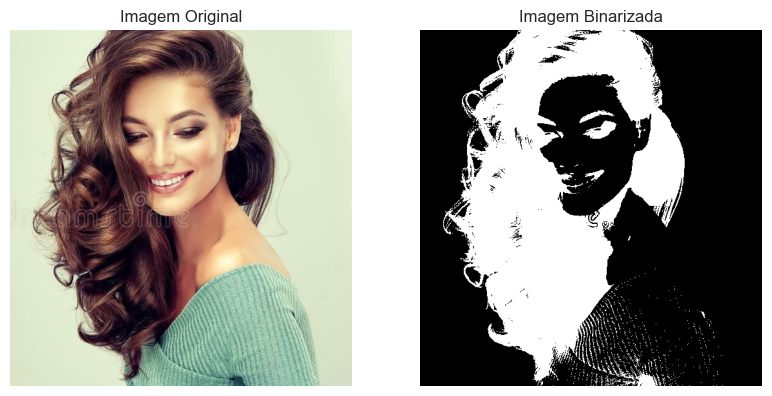

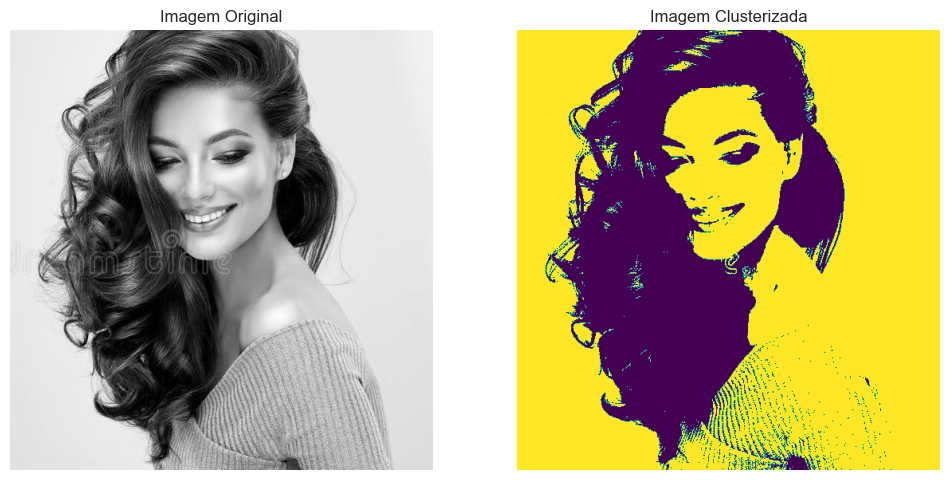

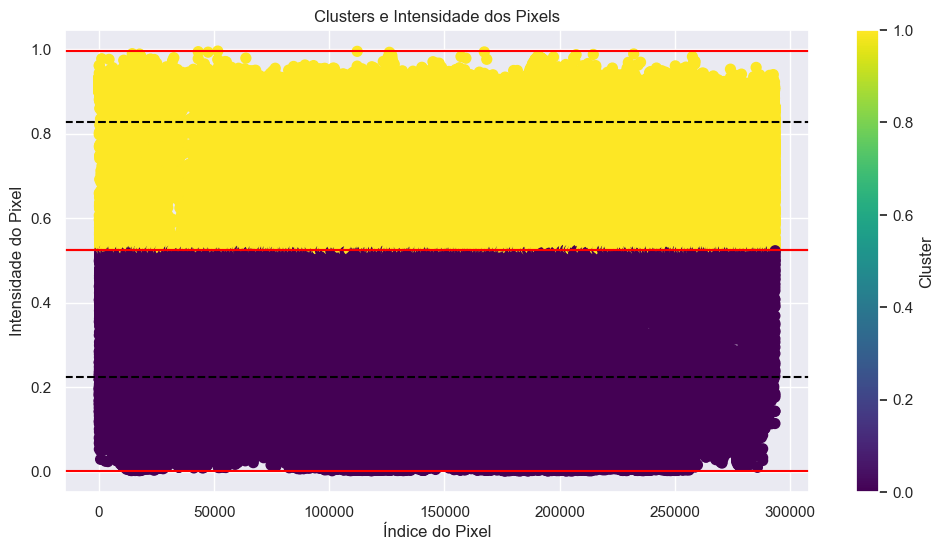

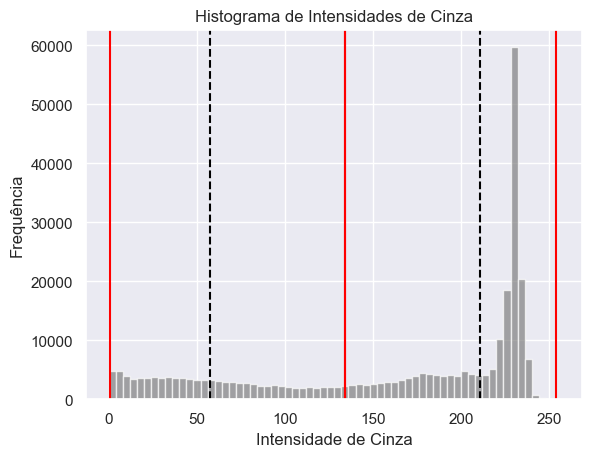

PROCESSAMENTO DA IMAGEM:  2
Média:  0.02275175412495931
Desvio Padrão:  0.0011829765088477318
Variabilidade:  0.05199495838213079
Media de iterações:  15.0


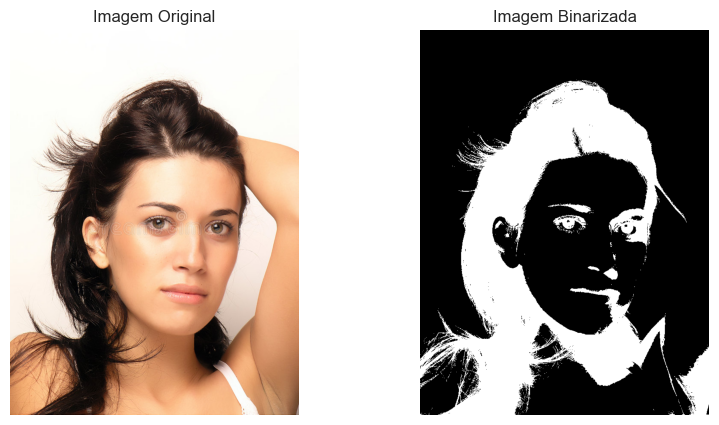

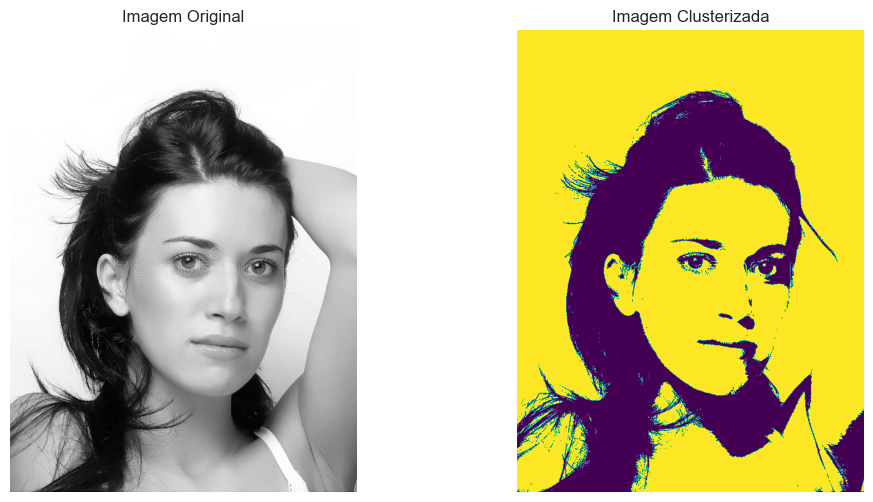

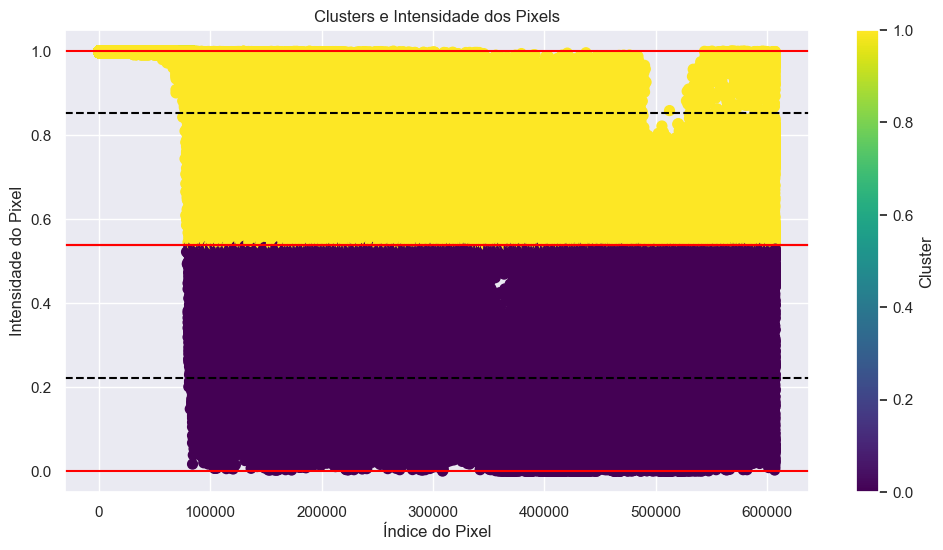

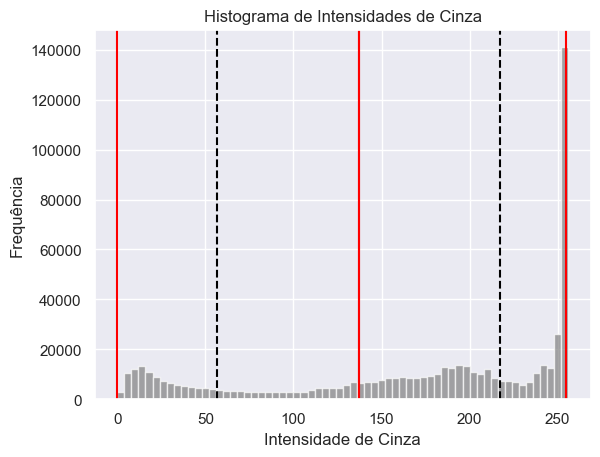

PROCESSAMENTO DA IMAGEM:  3
Média:  0.01207147240638733
Desvio Padrão:  0.0003895555274855504
Variabilidade:  0.03227075491465535
Media de iterações:  8.0


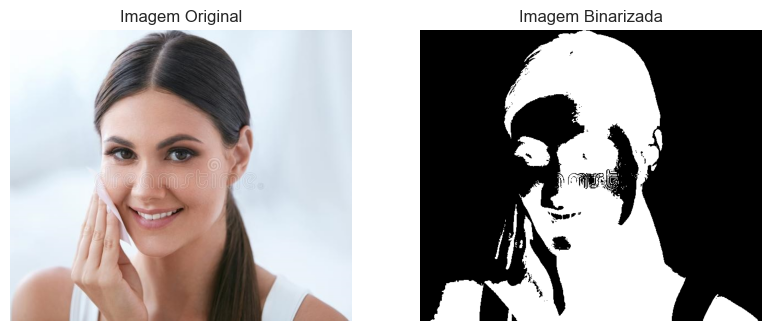

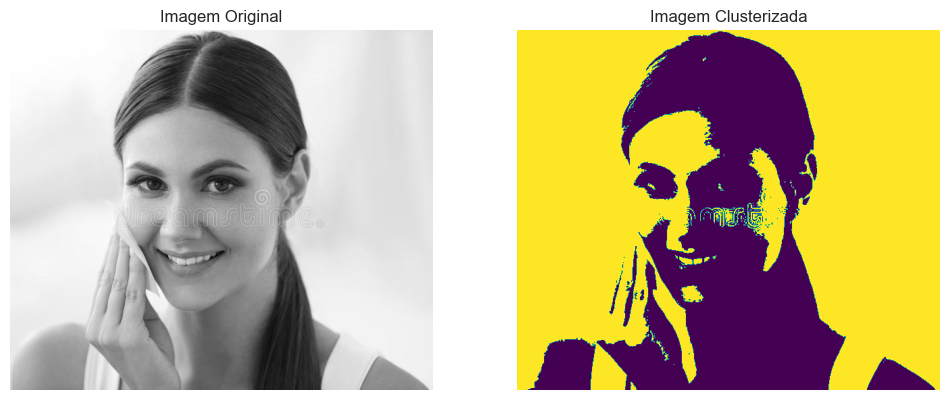

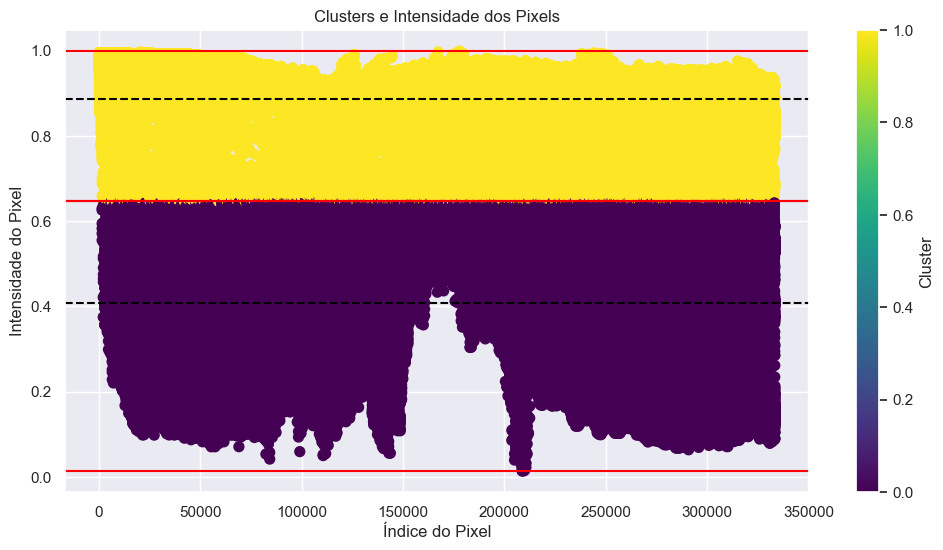

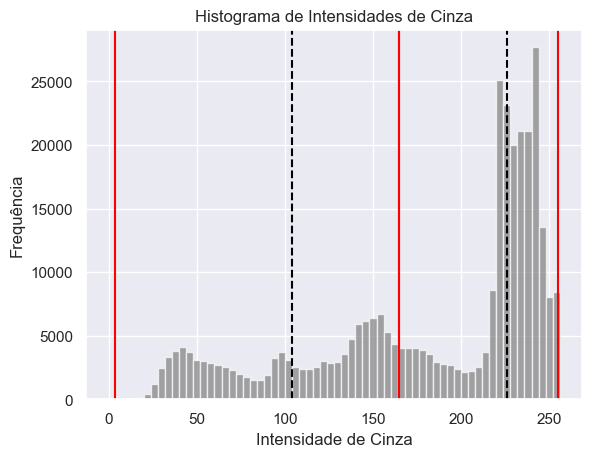

CLUSTERS:  3
PROCESSAMENTO DA IMAGEM:  4
Média:  0.012799022674560548
Desvio Padrão:  0.0006487328724843168
Variabilidade:  0.0506861257284702
Media de iterações:  25.0


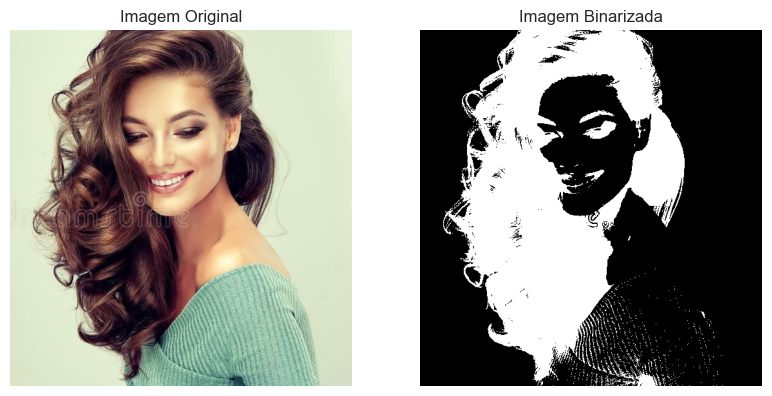

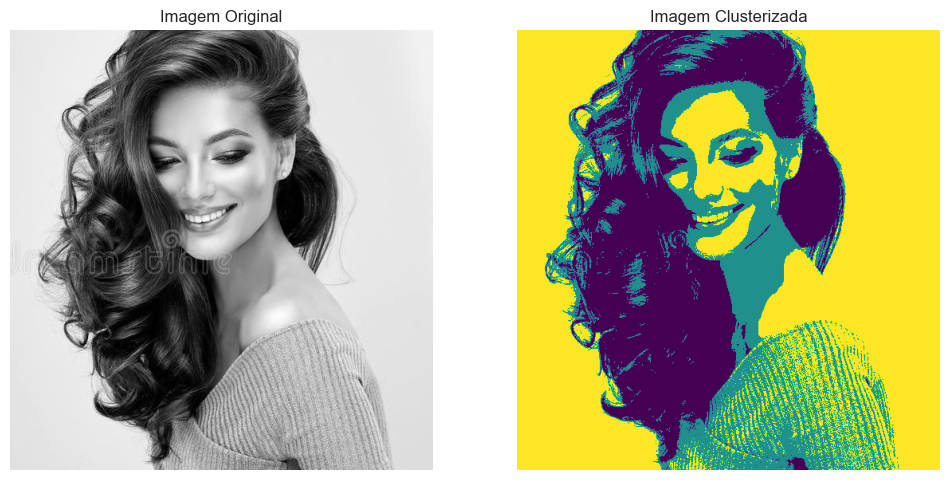

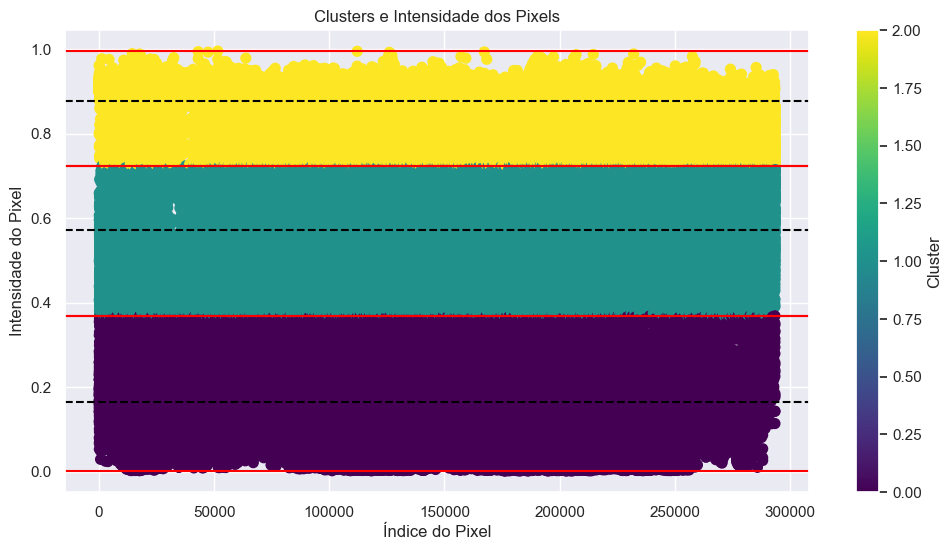

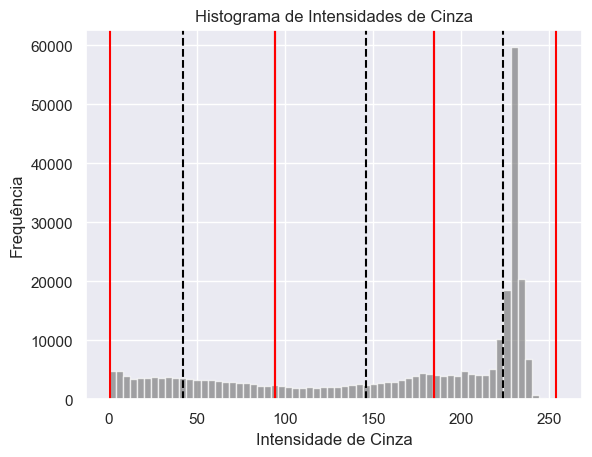

PROCESSAMENTO DA IMAGEM:  5
Média:  0.028680880864461265
Desvio Padrão:  0.0011910991026090568
Variabilidade:  0.04152937659892302
Media de iterações:  12.0


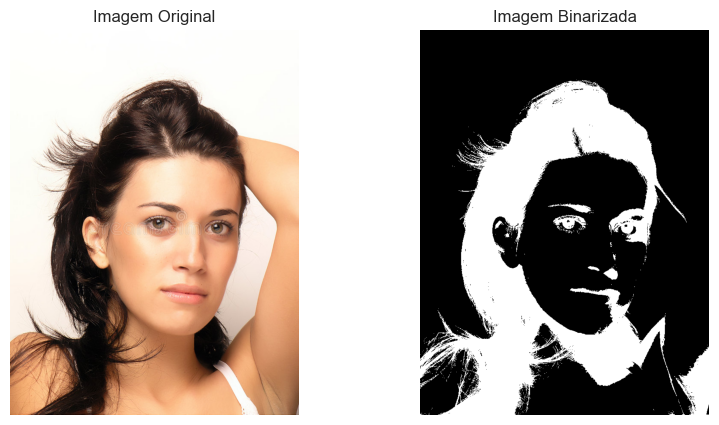

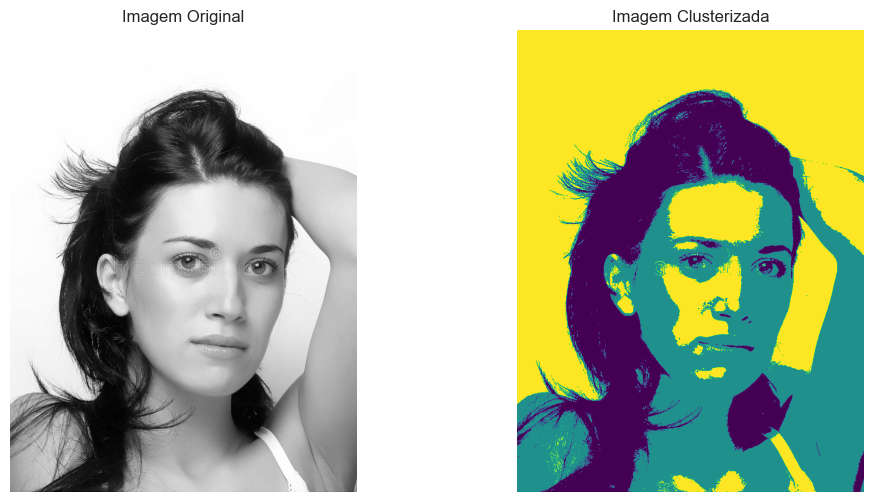

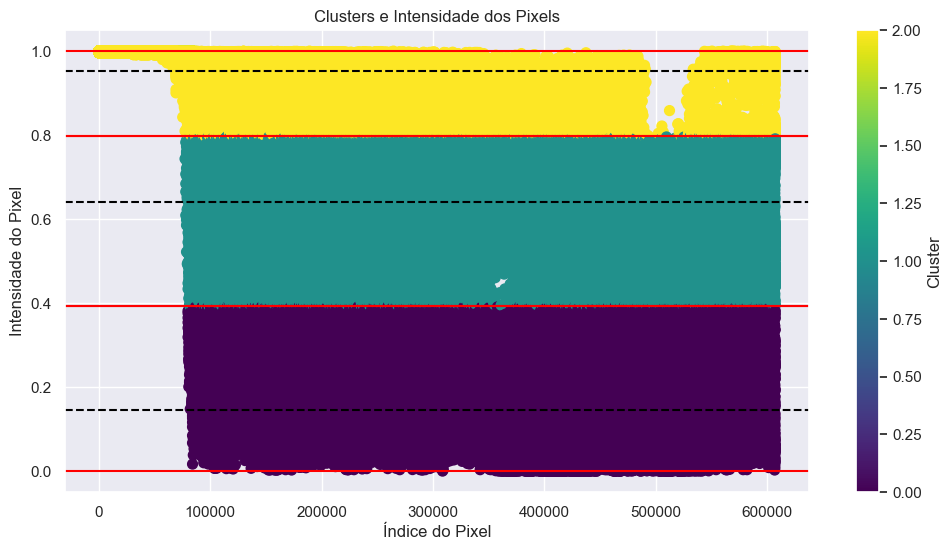

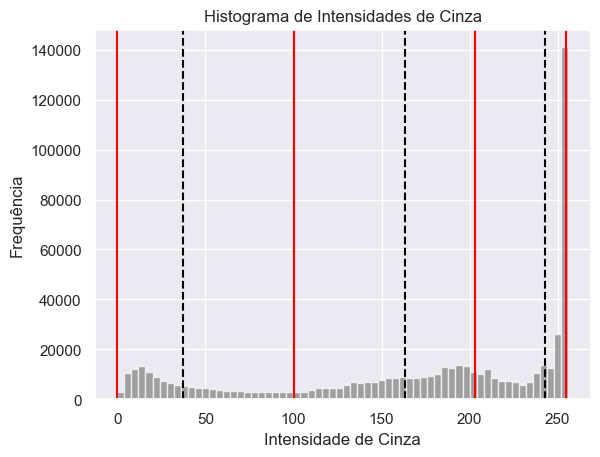

PROCESSAMENTO DA IMAGEM:  6
Média:  0.014985904326805702
Desvio Padrão:  0.000513545824187635
Variabilidade:  0.03426859086969089
Media de iterações:  13.0


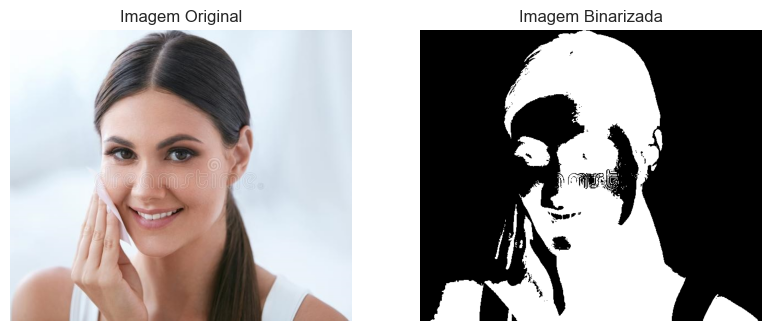

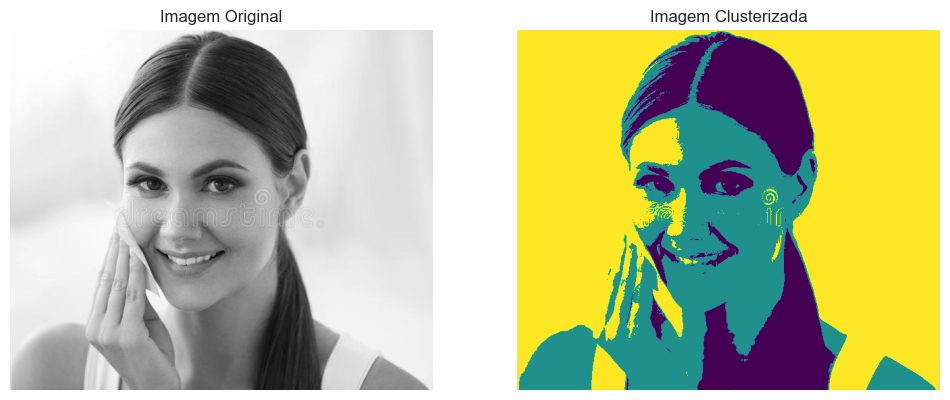

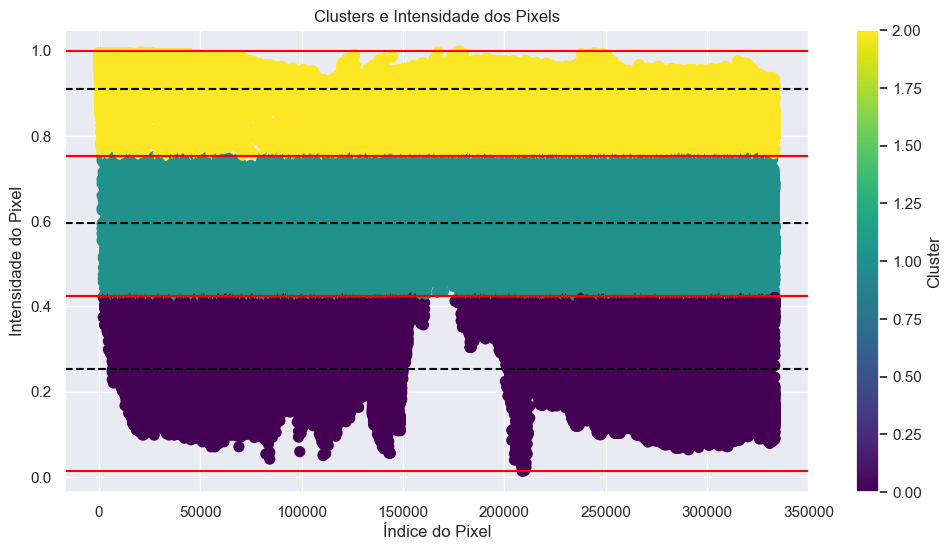

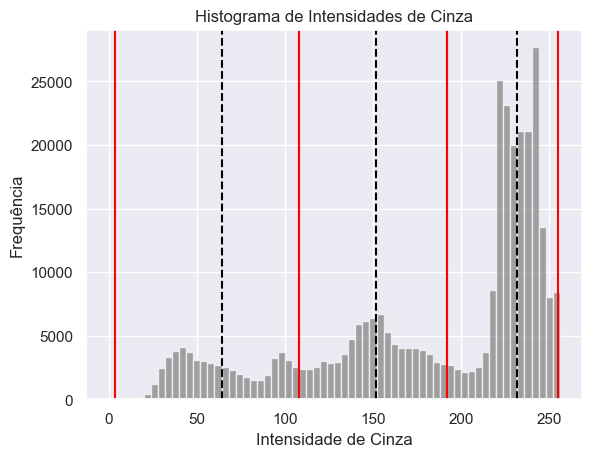

CLUSTERS:  4
PROCESSAMENTO DA IMAGEM:  7
Média:  0.016300499054693406
Desvio Padrão:  0.0016560444426759705
Variabilidade:  0.10159470805890114
Media de iterações:  31.0


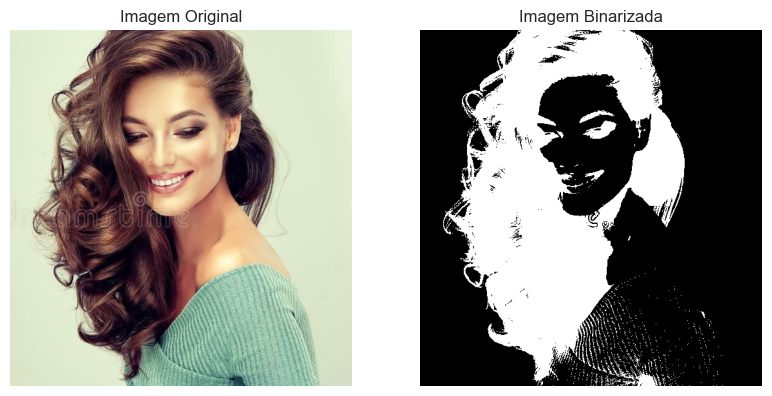

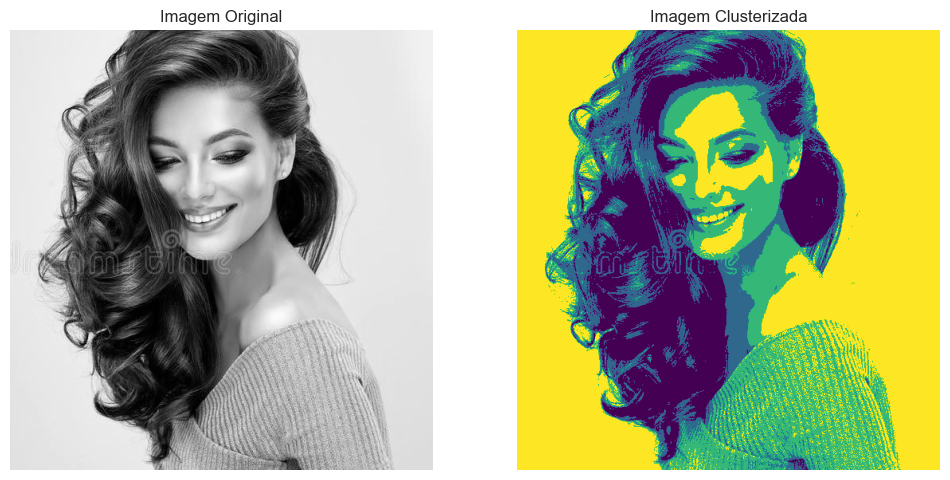

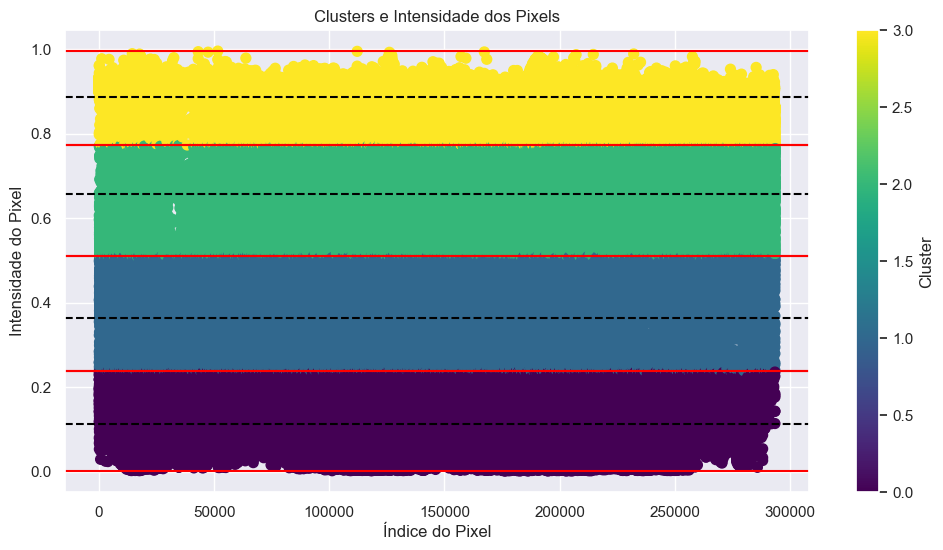

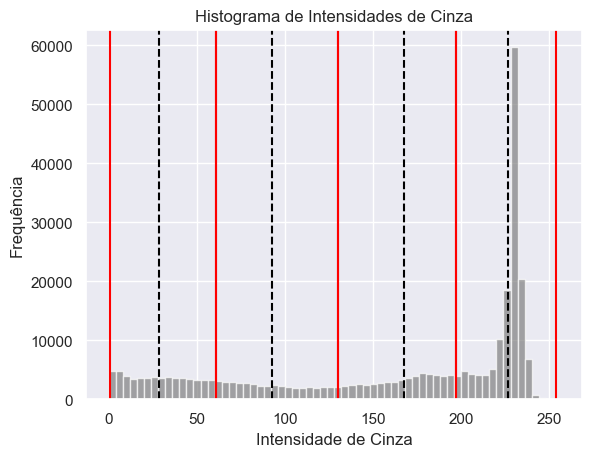

PROCESSAMENTO DA IMAGEM:  8
Média:  0.0347302794456482
Desvio Padrão:  0.0018229695817928505
Variabilidade:  0.05248934390653956
Media de iterações:  20.0


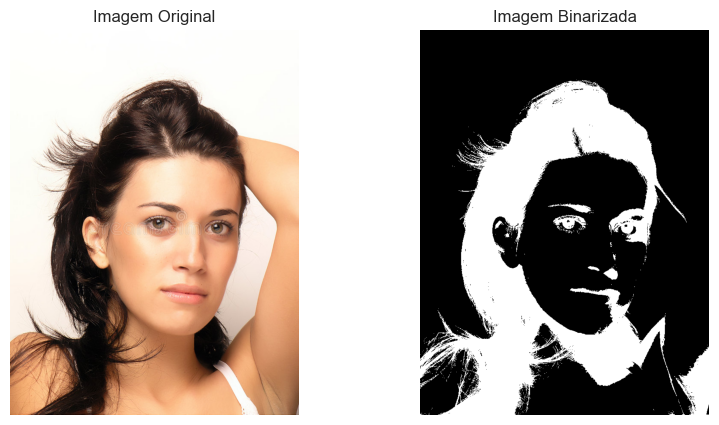

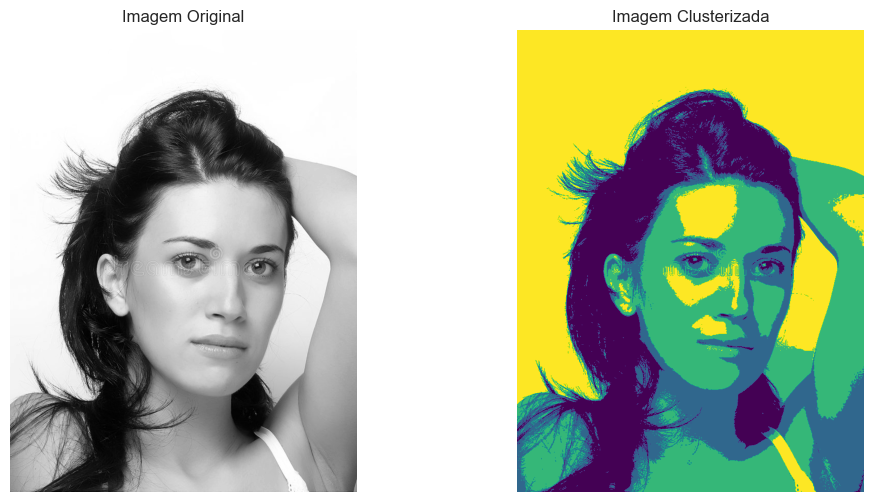

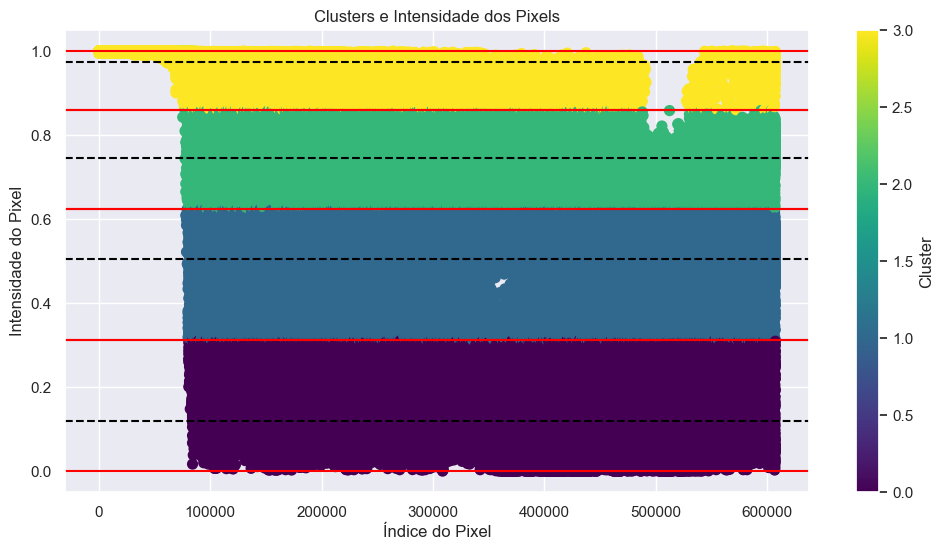

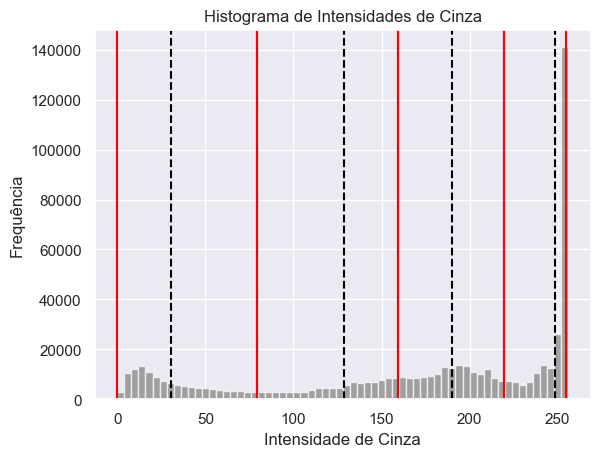

PROCESSAMENTO DA IMAGEM:  9
Média:  0.017708784692427693
Desvio Padrão:  0.0006660860280648262
Variabilidade:  0.03761331111274088
Media de iterações:  34.0


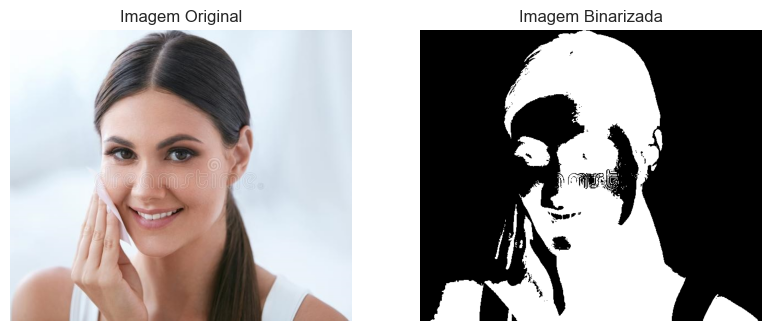

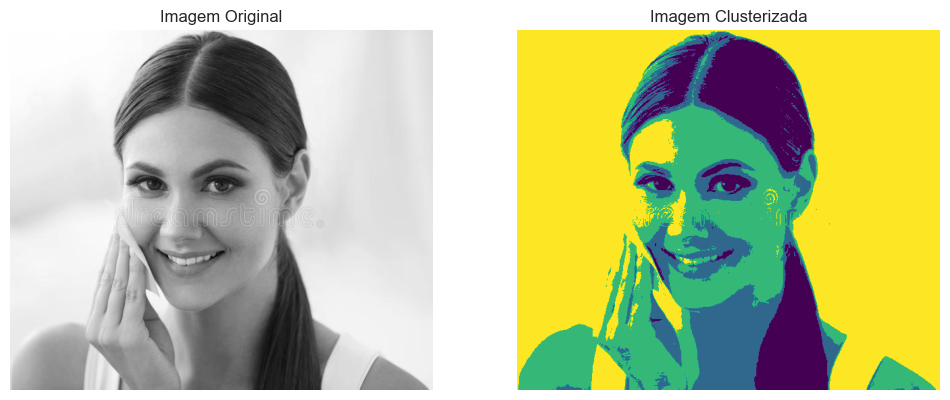

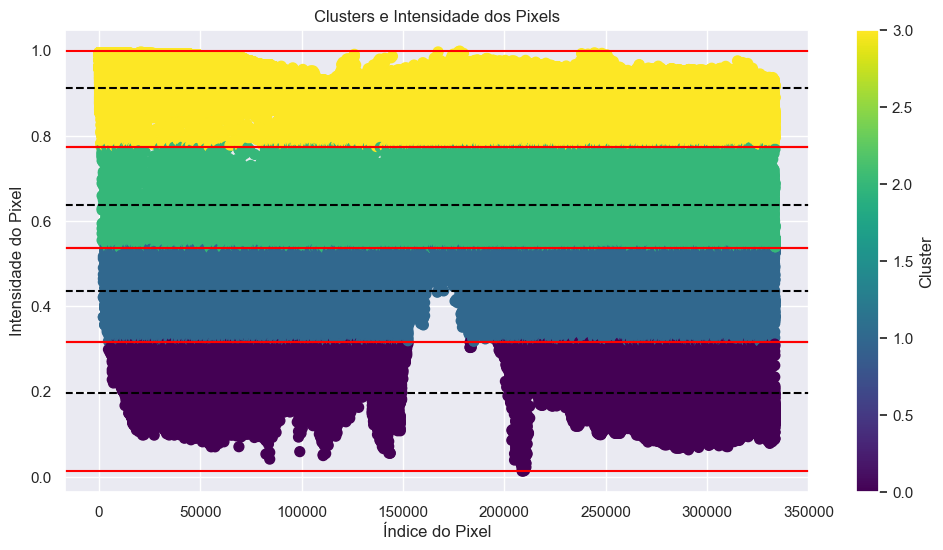

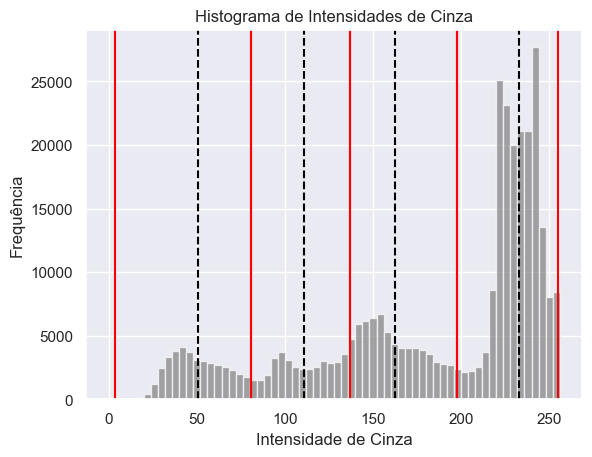

CLUSTERS:  5
PROCESSAMENTO DA IMAGEM:  10
Média:  0.018554202534935692
Desvio Padrão:  0.0006328440639958763
Variabilidade:  0.034107855770373036
Media de iterações:  44.0


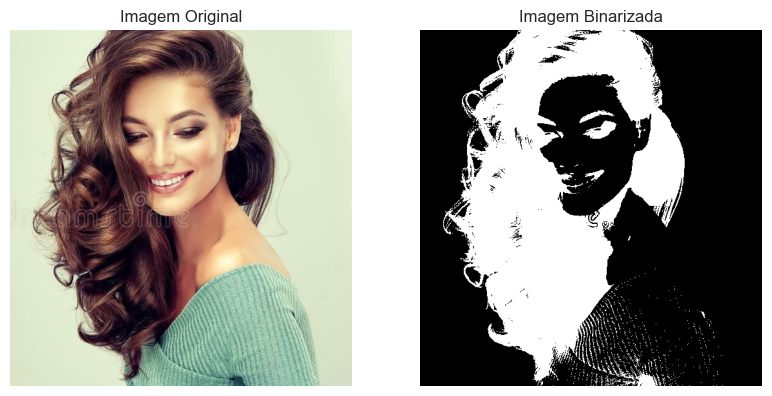

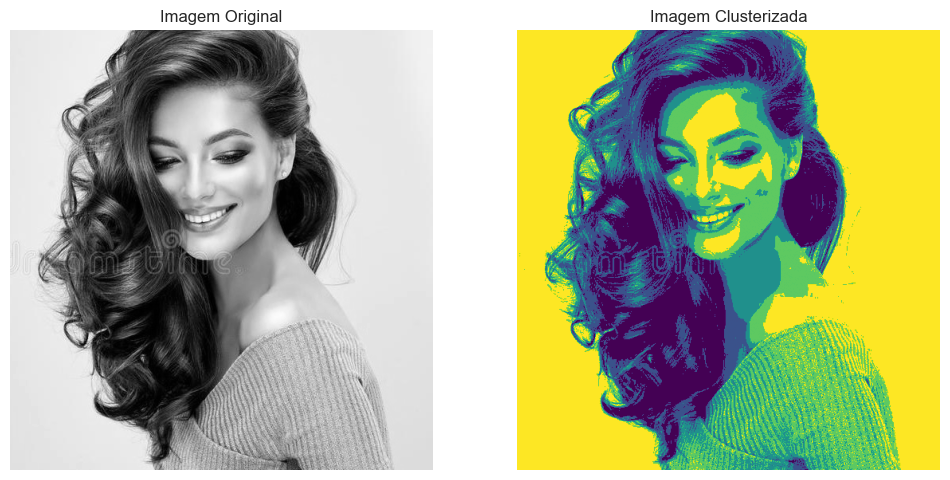

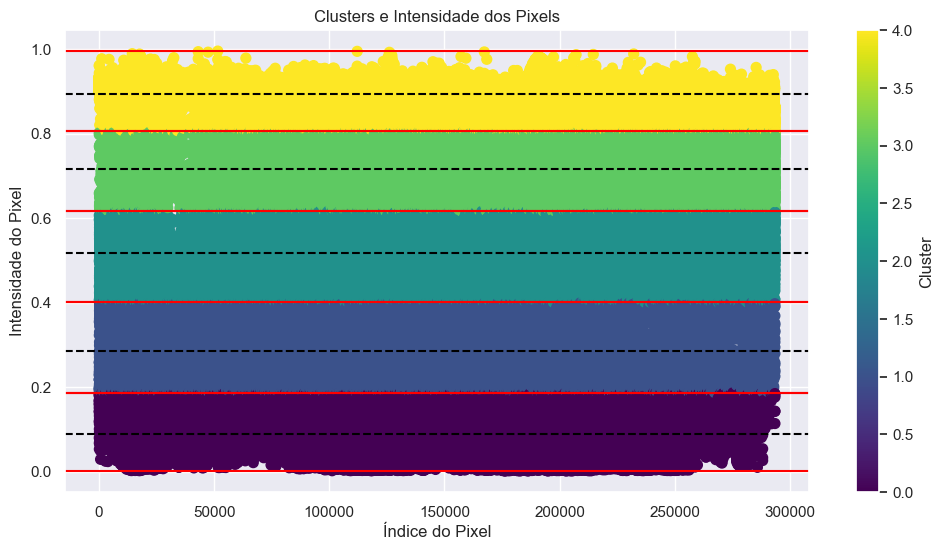

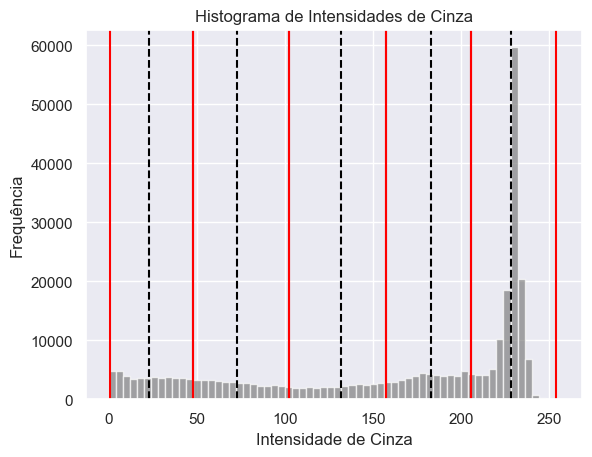

PROCESSAMENTO DA IMAGEM:  11
Média:  0.03936137252383762
Desvio Padrão:  0.0013813474677960567
Variabilidade:  0.03509398629225898
Media de iterações:  45.0


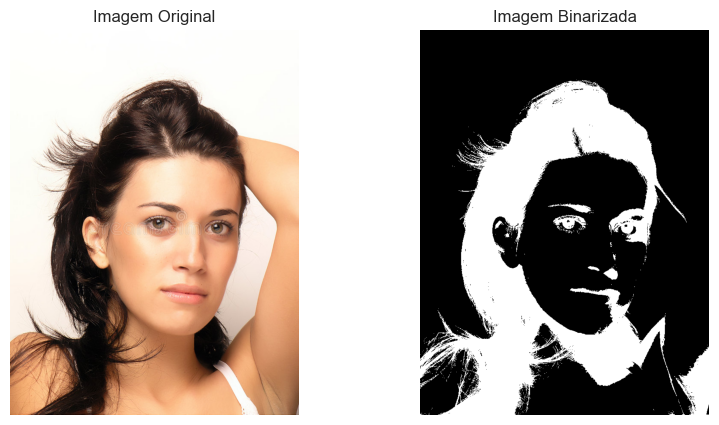

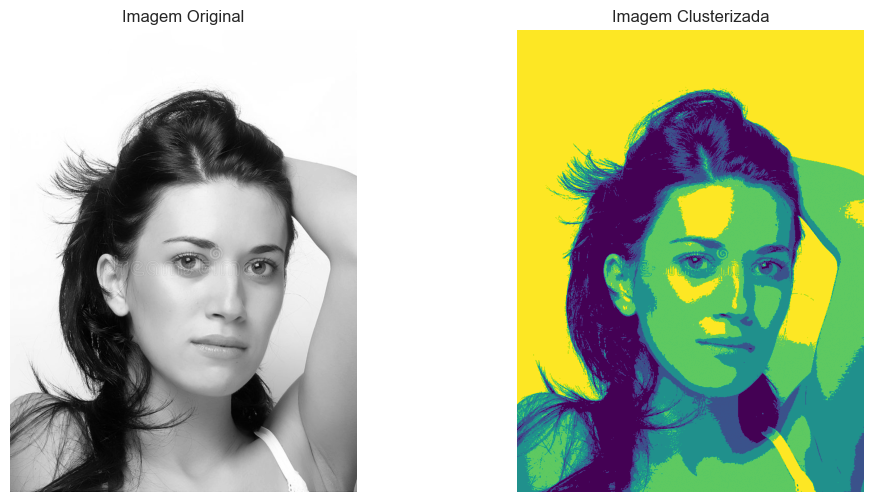

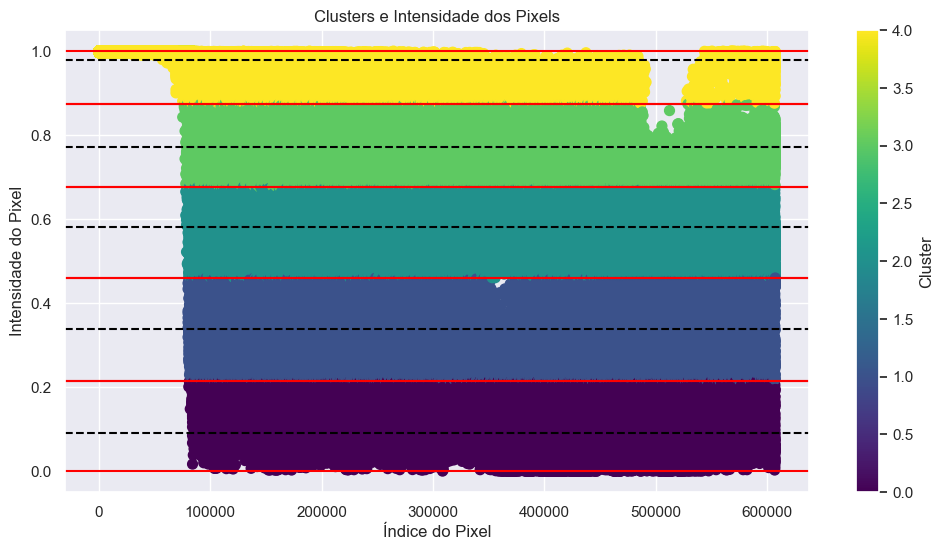

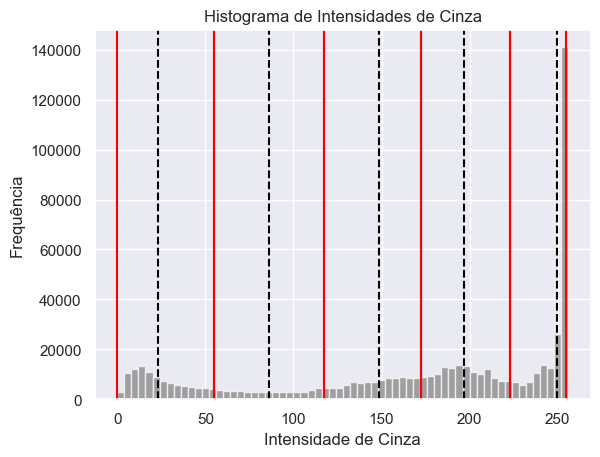

PROCESSAMENTO DA IMAGEM:  12
Média:  0.022067133585611978
Desvio Padrão:  0.0013138237340952754
Variabilidade:  0.05953758013011275
Media de iterações:  18.0


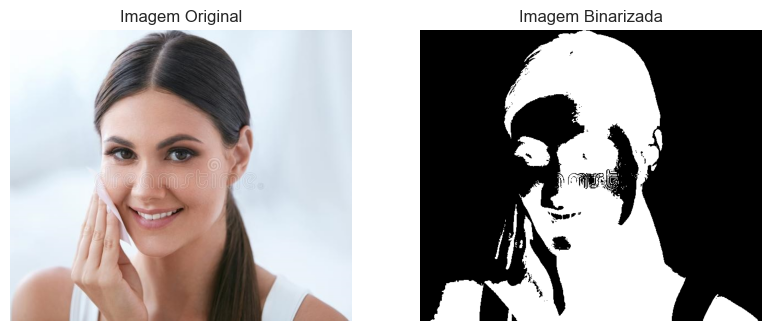

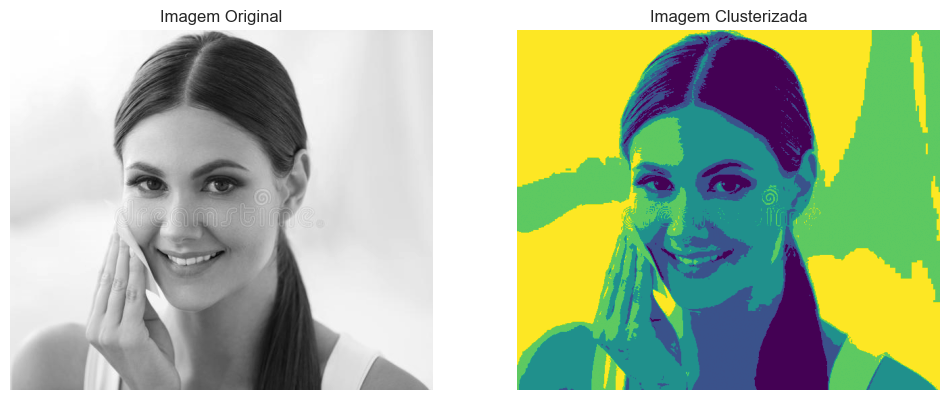

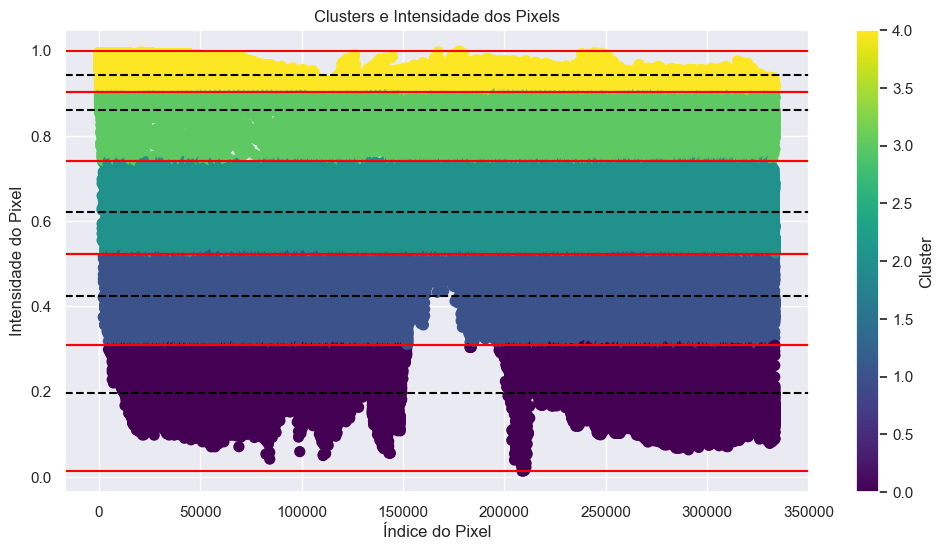

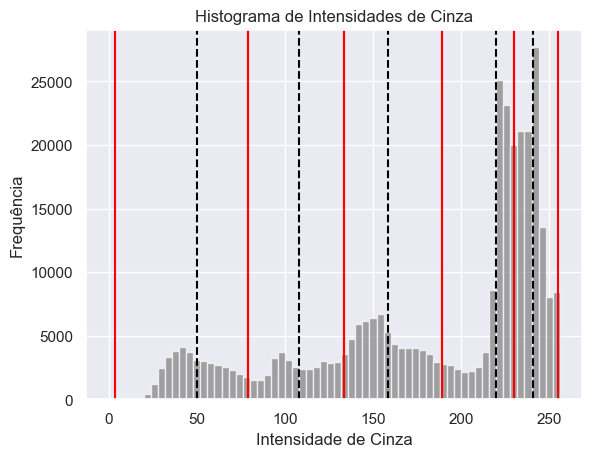

CLUSTERS:  6
PROCESSAMENTO DA IMAGEM:  13
Média:  0.021436460719389074
Desvio Padrão:  0.0008300571049992594
Variabilidade:  0.03872174216933492
Media de iterações:  85.0


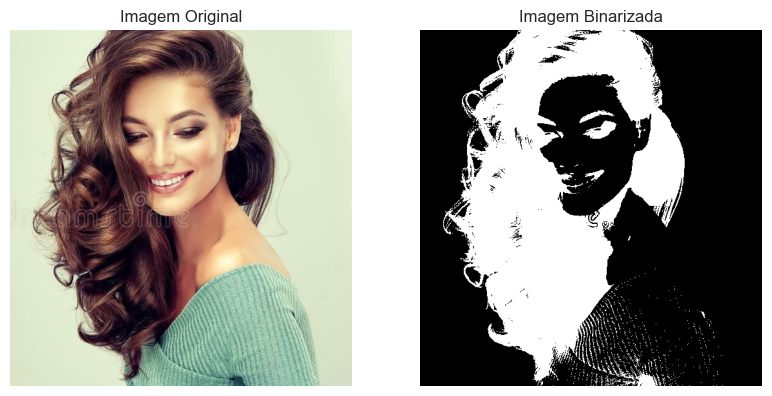

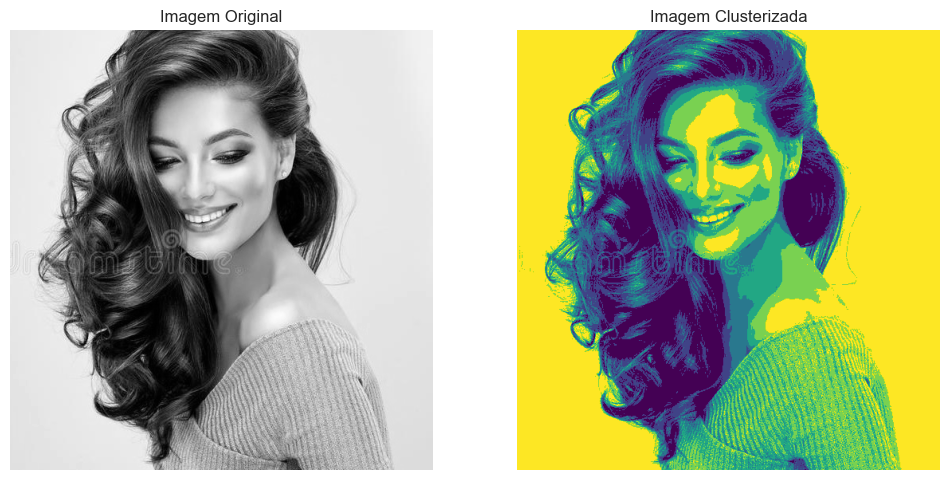

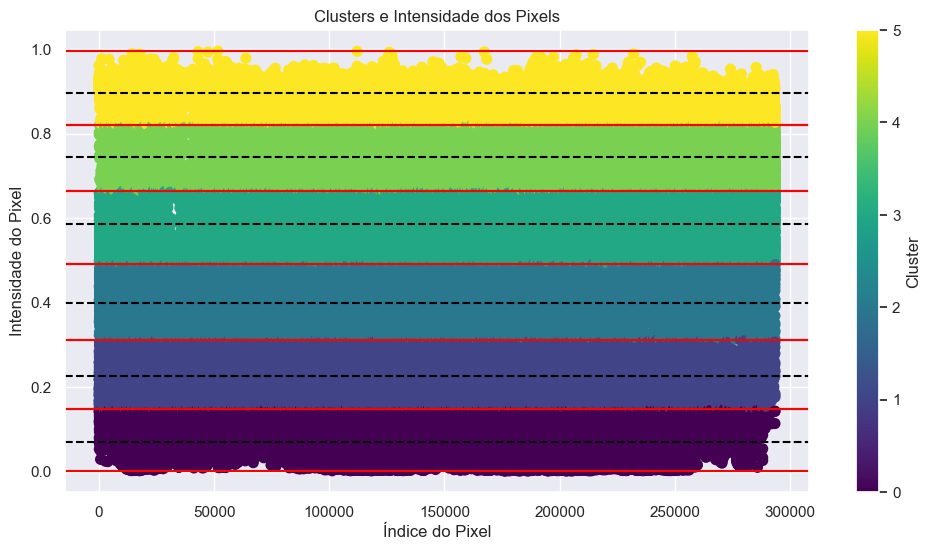

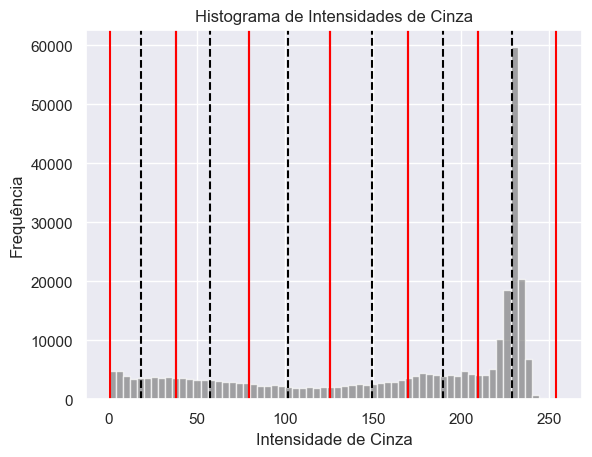

PROCESSAMENTO DA IMAGEM:  14
Média:  0.04536869993396834
Desvio Padrão:  0.001362267811292255
Variabilidade:  0.03002660012905288
Media de iterações:  51.0


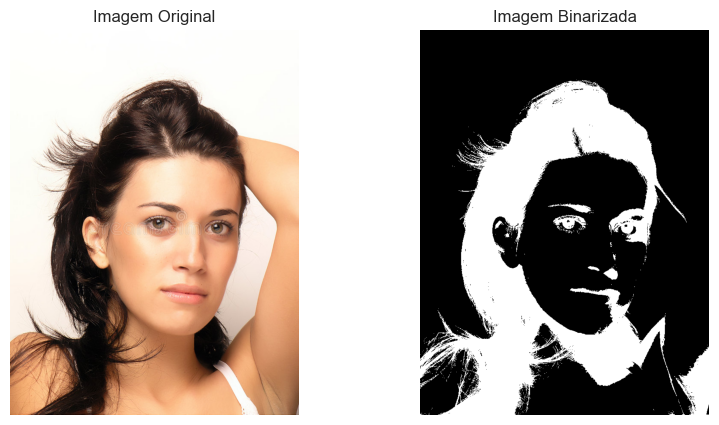

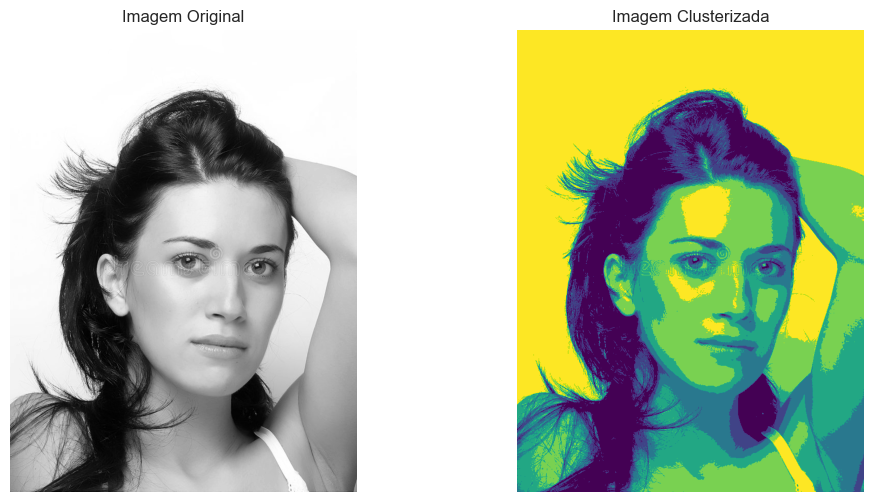

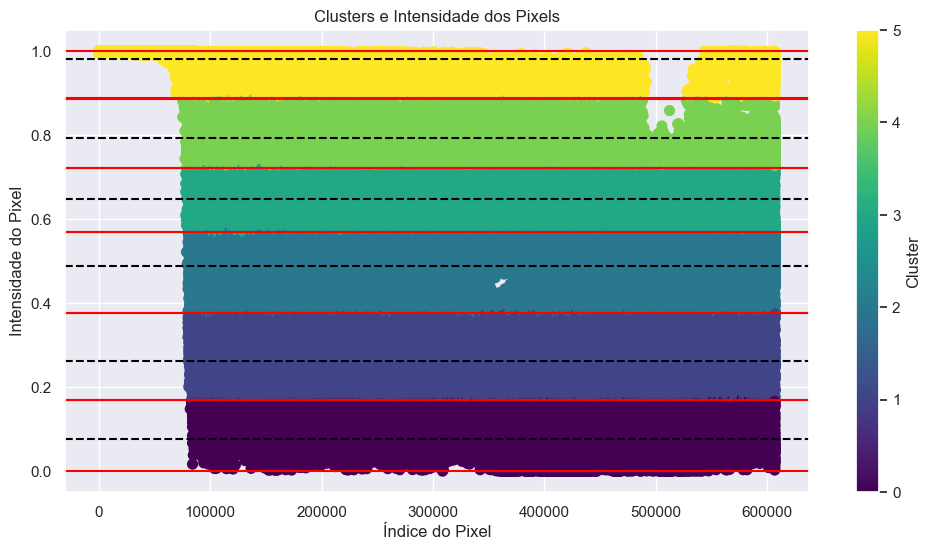

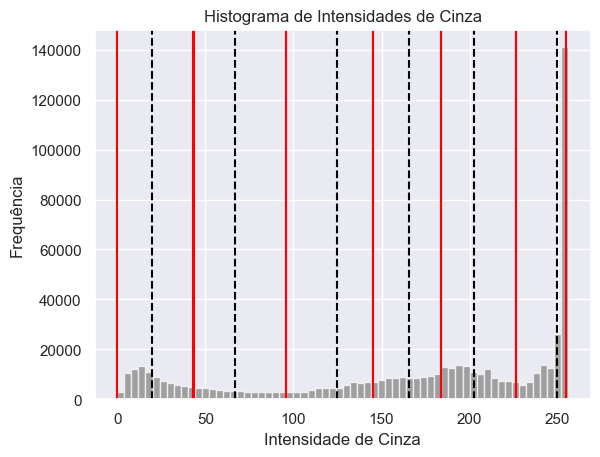

PROCESSAMENTO DA IMAGEM:  15
Média:  0.027777279168367384
Desvio Padrão:  0.0024307244601974387
Variabilidade:  0.08750765132409133
Media de iterações:  32.0


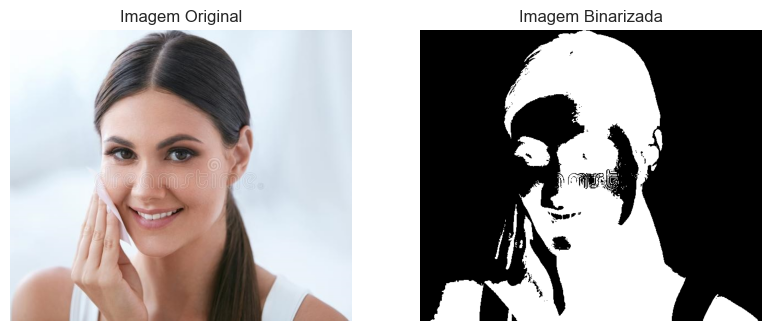

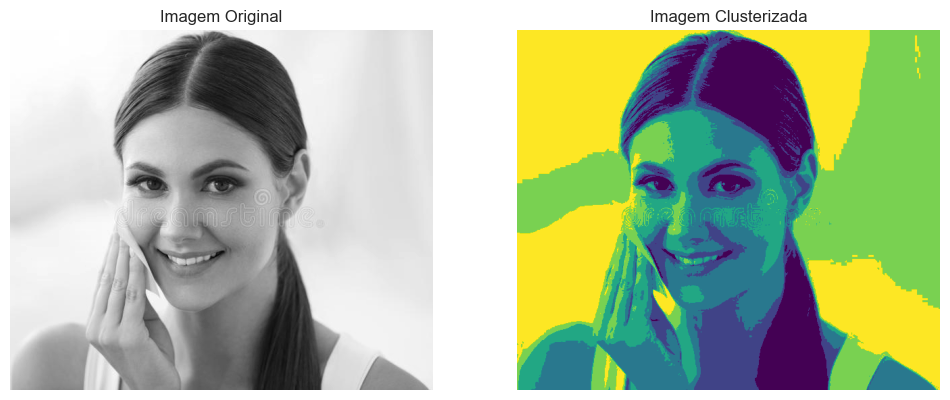

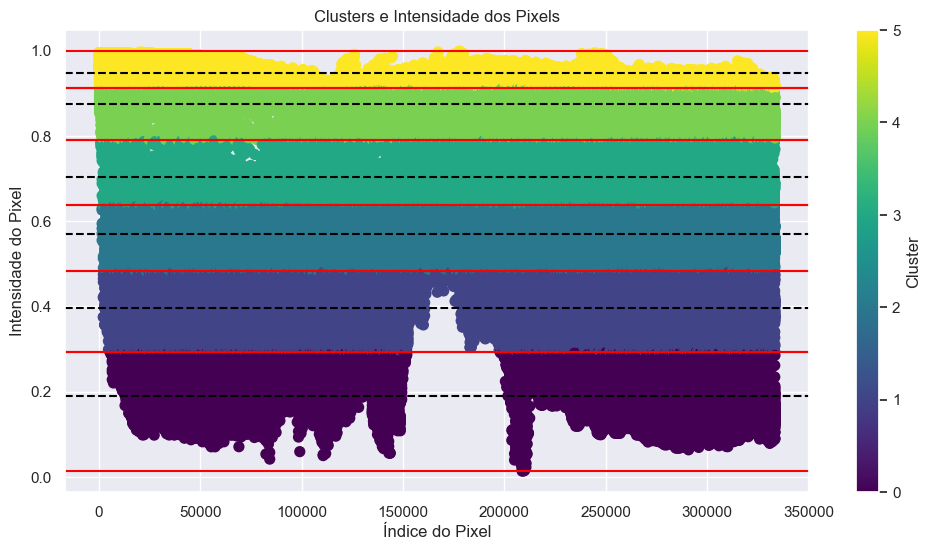

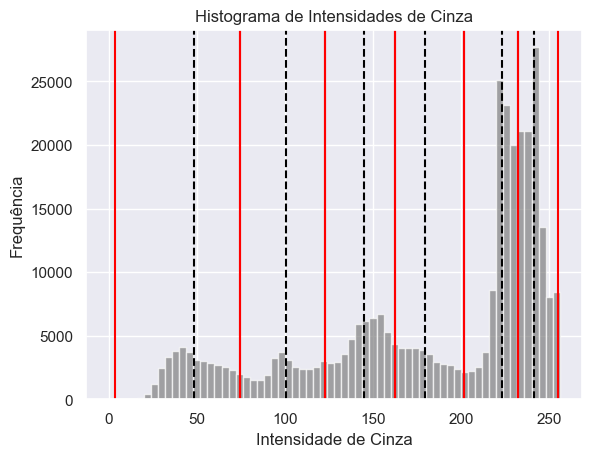

CLUSTERS:  7
PROCESSAMENTO DA IMAGEM:  16
Média:  0.02345595138017521
Desvio Padrão:  0.0013879624926164073
Variabilidade:  0.05917314843129759
Media de iterações:  86.0


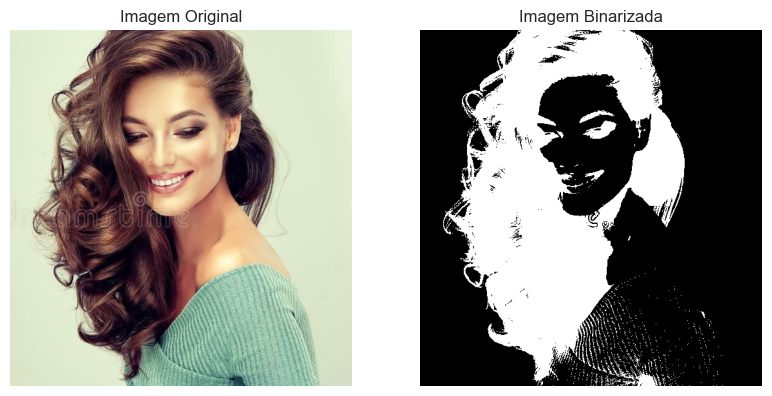

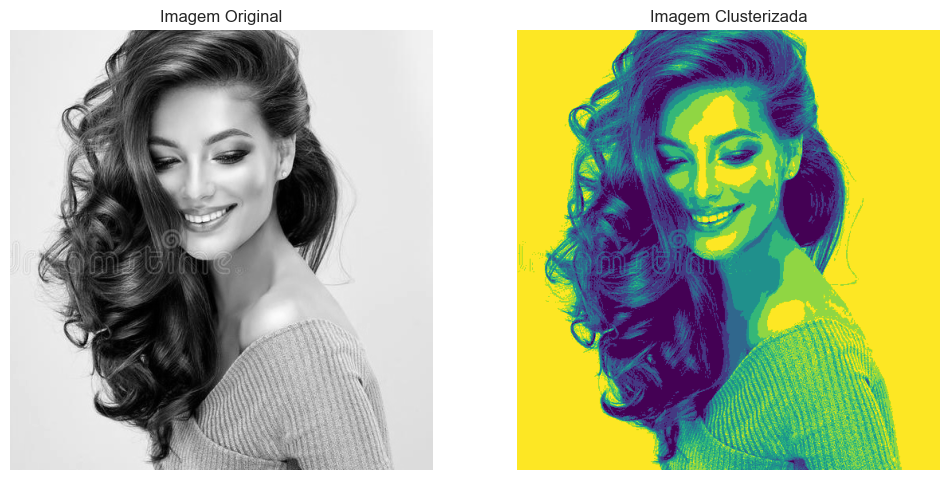

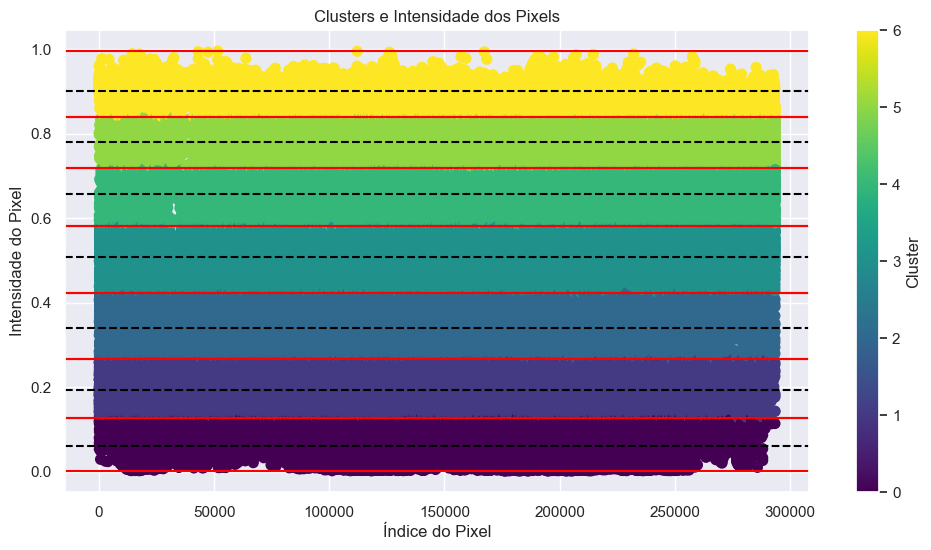

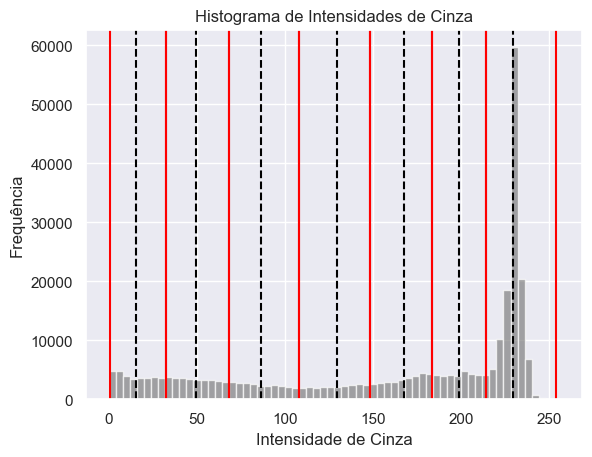

PROCESSAMENTO DA IMAGEM:  17
Média:  0.04799430370330811
Desvio Padrão:  0.0006578441147493183
Variabilidade:  0.013706712338530604
Media de iterações:  50.0


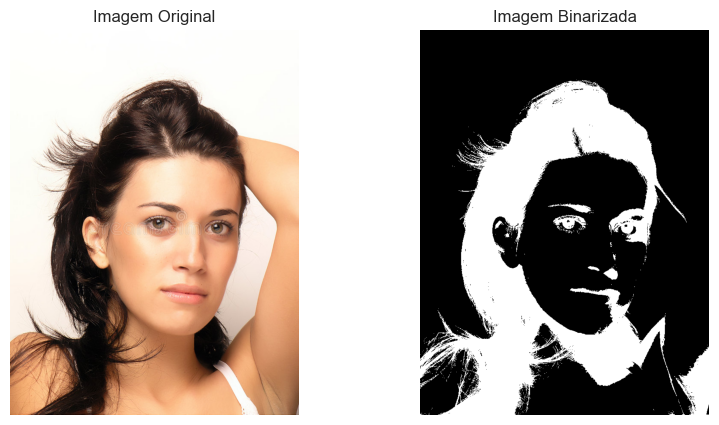

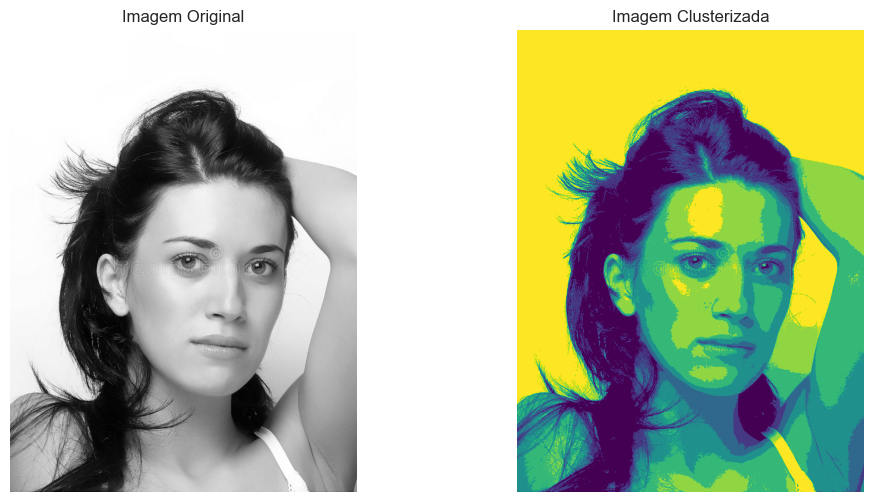

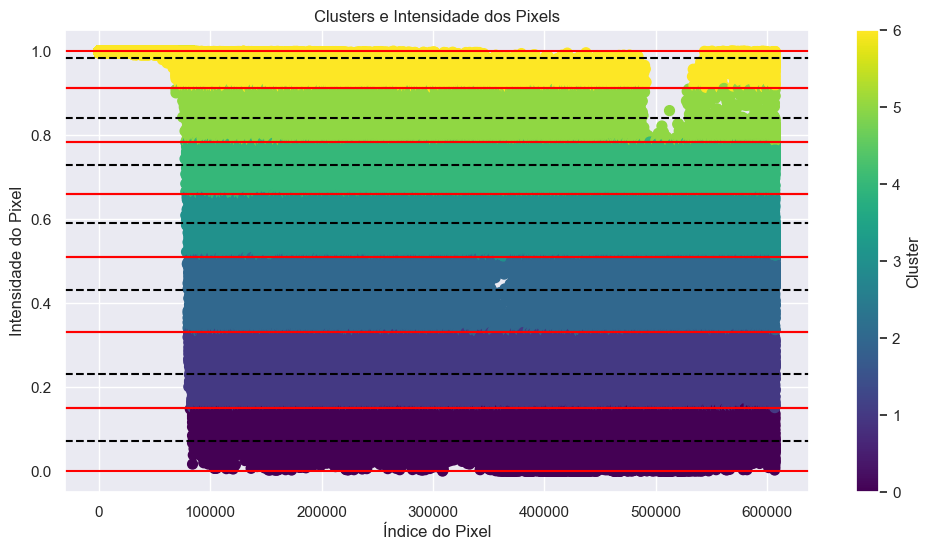

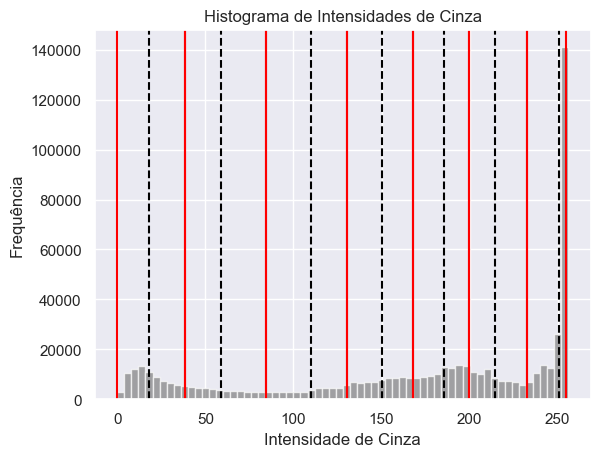

PROCESSAMENTO DA IMAGEM:  18
Média:  0.026887661933898927
Desvio Padrão:  0.0013783590240954882
Variabilidade:  0.051263625207876716
Media de iterações:  25.0


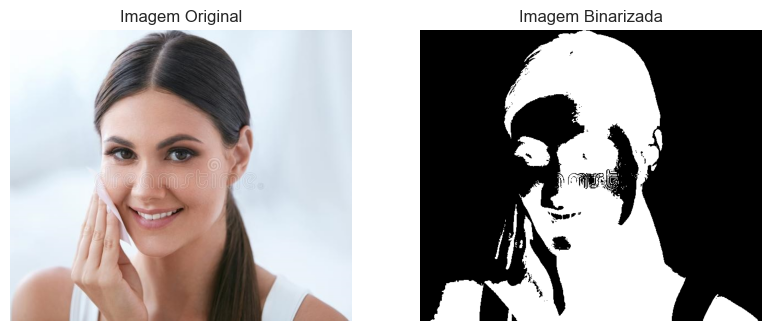

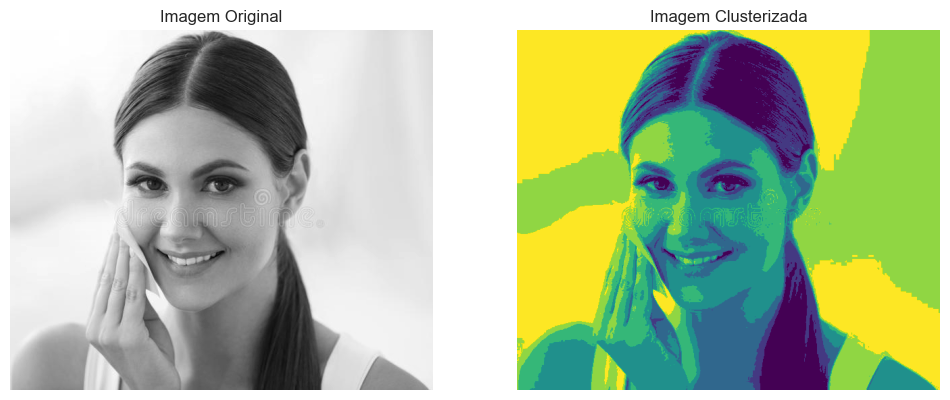

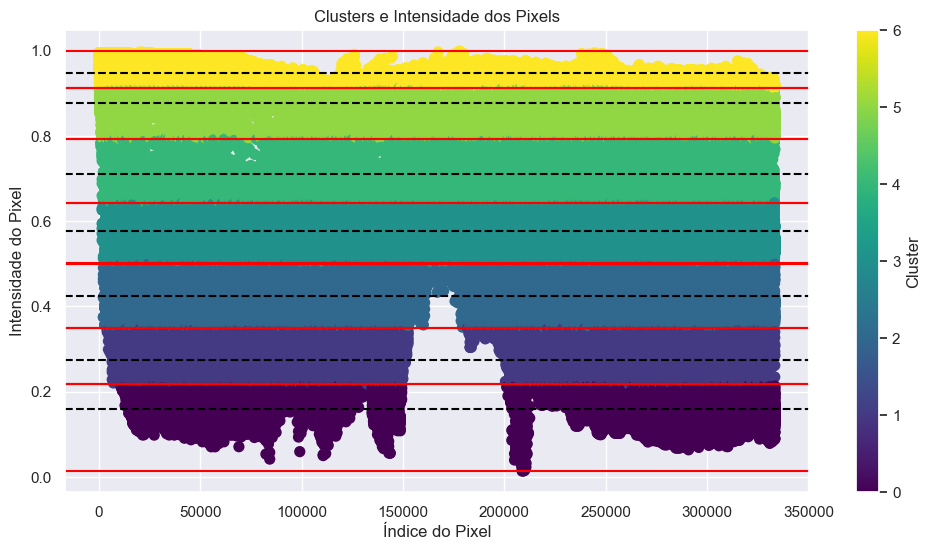

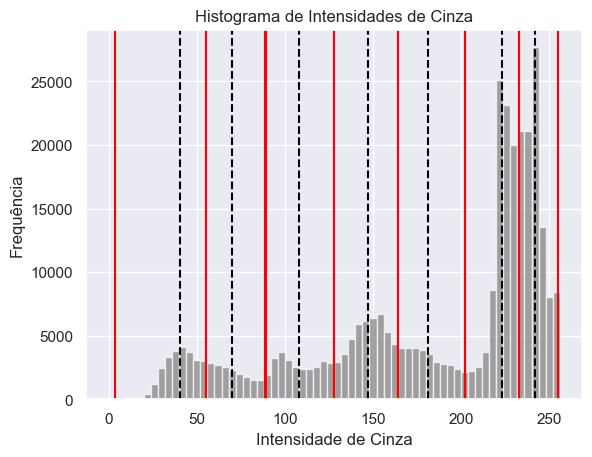

In [41]:
from PIL import Image
from skimage import color
from skimage.filters import threshold_otsu
from time import time
import numpy as np
import matplotlib.pyplot as plt
from KMeans import KMeans

print("n:", n)
R = 10
ctr = 0
t = []
s = []
num_iteracoes = []
num_pixels = []
tk = []
for k in range(2, 8): # Configurar o número de clusters
    print("CLUSTERS: ", k)
    for image in Img[:nImg]:
        # Converter a imagem para escala de cinza
        print("PROCESSAMENTO DA IMAGEM: ", ctr + 1)
        T = []
        iteracoes_por_repeticao = []
        
        # REPETIÇÕES DO EXPERIMENTO--SEM PLOTAR-SÓ PARA MEDIR O TEMPO MEDIO--E CTRLE QLD <<<<
        for r in range(R):
            # Converter a imagem para escala de cinza
            bw_img = color.rgb2gray(image)
    
            # Achatar a imagem em uma matriz 2D para a clusterização
            X = bw_img.reshape(-1, 1)
    
            # Inicializar o KMeans e contar o tempo de execução
            tic = time()
            kmeans = KMeans(k=k)
            clusters, centroids, fit_OK, numero_iteracoes_realizadas = kmeans.fit(X)
            toc = time()
            
            iteracoes_por_repeticao.append(numero_iteracoes_realizadas)
    
            # Converter os clusters de volta para a forma original da imagem
            clustered_img = clusters.reshape(bw_img.shape)
    
            
            T.append((toc - tic)/numero_iteracoes_realizadas)
            
            # Converter a imagem para escala de cinza e aplicar thresholding usando o método de Otsu
            limiar = threshold_otsu(bw_img)
            # Construir a máscara binarizada da imagem
            imagem_binarizada = bw_img > limiar
    
        # Gerar uma lista com os valores que não excedem K vezes a média
        num_iteracoes.append(np.mean(iteracoes_por_repeticao))
        t.append(np.mean(T))
        s.append(np.std(T))
        num_pixels.append(image.size)
        
        print("Média: ", np.mean(T))
        print("Desvio Padrão: ", np.std(T))
        print("Variabilidade: ", np.std(T)/np.mean(T))
        print("Media de iterações: ", np.mean(iteracoes_por_repeticao))
    
        # Plotar a imagem original, a imagem binarizada e a imagem clusterizada
        plt.figure(figsize=(15, 5))
    
        plt.subplot(1, 3, 1)
        plt.imshow(image, cmap='gray')
        plt.title('Imagem Original')
        plt.axis('off')
    
        plt.subplot(1, 3, 2)
        plt.imshow(imagem_binarizada, cmap='binary')
        plt.title('Imagem Binarizada')
        plt.axis('off')
        
        # Plotar os clusters
        kmeans.plot_clusters(bw_img, clusters)
    
        ctr += 1
    tk.append(np.mean(t))

# 5. Determinando a função que ajusta os dados para estimar "experimentalmente" a complexidade do algoritmo

[2, 3, 4, 5, 6, 7]
[0.01516578617722097, 0.016993861066248405, 0.018966969954473303, 0.020890453186220417, 0.02301785853709132, 0.024644766392986225]


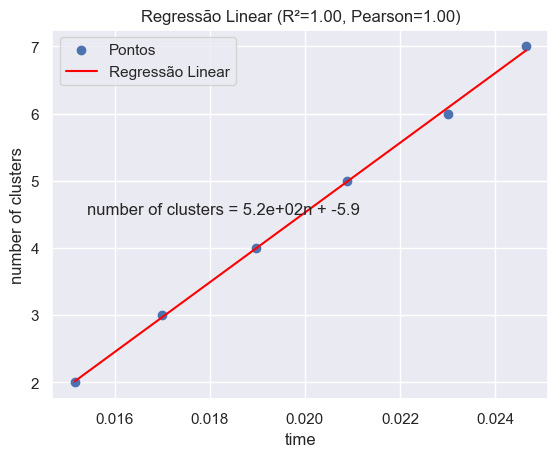

In [48]:
k = [2, 3, 4, 5, 6, 7]
print (k)
print (tk)
plotRegressao(tk, k, "time", "number of clusters")